[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Open Vocabluary Object Detection with Qwen3-VL

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/open-vocabluary-object-detection-with-qwen3-vl.ipynb)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/QwenLM/Qwen3-VL)

Qwen3-VL gives you a strong omni recognition layer. It is trained on broader and cleaner visual data, so it recognizes many entity types in one model: celebrities, anime characters, products, landmarks, animals, and plants. It handles dense scenes with many instances and returns structured JSON with labels and bounding boxes, which fits detection-style workflows. You can point it at an image, ask high-level questions, and still get precise, machine-friendly outputs that plug into your own tools or code.

For grounding, Qwen3-VL moves to a relative 2D coordinate system from 0 to 1000 on width and height, which simplifies integration with resizing, slicing, and postprocessing. It supports multi-target grounding in complex scenes and can output hundreds of boxes across categories such as head, hand, man, woman, glasses in one pass. It also parses spatial relations like left or right, front or behind, far or near, and handles occlusion, viewpoint changes, and motion patterns. On top of that, it supports 3D grounding with depth-aware reasoning, which gives you a starting point for robotics, navigation, and other embodied AI applications.

![Qwen2.5-VL](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/qwen3vl_arc.jpg)

## Environment setup

### Configure your API keys

To benchmark Qwen3-VL, you need to provide your HuggingFace Token. Follow these steps:

- Open your HuggingFace Settings page. Click Access Tokens then New Token to generate a new token.
- In Colab, go to the left pane and click on Secrets (🔑). Store your HuggingFace Access Token under the name HF_TOKEN.

In [1]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")

### Check GPU availability

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `L4 GPU`, and then click `Save`.

The required VRAM depends on the Qwen3-VL version you want to use. A100 works for Qwen or Qwen3-VL-8B-Instruct. If you plan to load a smaller checkpoint, switch to L4 or T4.

In [2]:
!nvidia-smi

Sun Nov 16 15:47:32 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   32C    P0             57W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

### Install dependencies

In [3]:
!pip install -q transformers supervision==0.27.0rc6

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.4/212.4 kB 16.6 MB/s eta 0:00:00


### Download example data

In [8]:
!wget -q https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/traffic_jam.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/solvay_conference.jpg
!wget -q https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/basketball_game.jpg

## Load Qwen3-VL model

Loads the Qwen3-VL model (and its processor) from Hugging Face, preparing the model for inference.

In [ ]:
from transformers import AutoProcessor, AutoModelForImageTextToText

# MODEL_ID = "Qwen/Qwen3-VL-2B-Instruct"
# MODEL_ID = "Qwen/Qwen3-VL-4B-Instruct"
MODEL_ID = "Qwen/Qwen3-VL-8B-Instruct"

processor = AutoProcessor.from_pretrained(MODEL_ID)
model = AutoModelForImageTextToText.from_pretrained(MODEL_ID).to("cuda")

## Qwen3-VL inference and visualization

### Define helper functions

Creates a function to run text prompts against the Qwen3-VL model and parse the results.

In [42]:
import torch
from PIL import Image

def qwen_detect(image: Image, target: str, max_new_tokens: int = 1024):

    prompt = (
        f"Outline the position of {target} and output all the coordinates in JSON format."
    )

    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image},
                {"type": "text", "text": prompt},
            ],
        }
    ]

    inputs = processor.apply_chat_template(
        messages,
        tokenize=True,
        add_generation_prompt=True,
        return_dict=True,
        return_tensors="pt",
    ).to("cuda")

    with torch.inference_mode():
        gen = model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
        )

    trimmed = [g[len(i):] for i, g in zip(inputs.input_ids, gen)]
    text = processor.batch_decode(trimmed, skip_special_tokens=True)[0]
    return text

Creates a function to annotate an image with detection results.

In [40]:
import supervision as sv
from PIL import Image

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

def annotate_image(image: Image, detections: sv.Detections, smart_position = True) -> Image:
    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    color_by_class = detections.class_id is not None
    box_annotator = sv.BoxAnnotator(
        color=COLOR,
        color_lookup=sv.ColorLookup.CLASS if color_by_class else sv.ColorLookup.INDEX,
        thickness=thickness
    )
    label_annotator = sv.LabelAnnotator(
        color=COLOR,
        color_lookup=sv.ColorLookup.CLASS if color_by_class else sv.ColorLookup.INDEX,
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness - 1,
        smart_position=smart_position
    )

    annotated_image = image.copy()
    annotated_image = box_annotator.annotate(annotated_image, detections)
    return label_annotator.annotate(annotated_image, detections)

### Detect "yellow taxi"

```json
[
    {"bbox_2d": [218, 103, 343, 205], "label": "yellow taxi"}
]
```


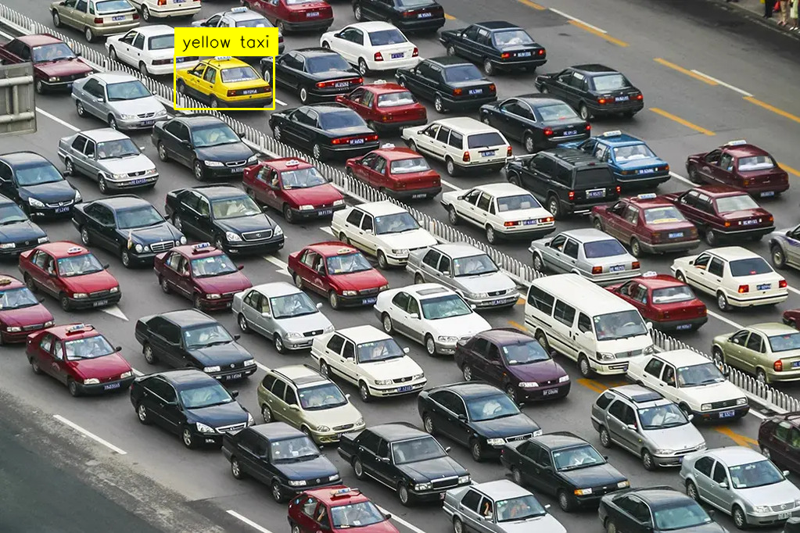

In [9]:
IMAGE = "/content/traffic_jam.jpg"

TARGET = "yellow taxi"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "taxi"

```json
[
	{"bbox_2d": [219, 101, 344, 212], "label": "taxi"},
	{"bbox_2d": [35, 605, 170, 743], "label": "taxi"},
	{"bbox_2d": [25, 450, 152, 584], "label": "taxi"},
	{"bbox_2d": [194, 450, 321, 584], "label": "taxi"},
	{"bbox_2d": [303, 294, 435, 417], "label": "taxi"},
	{"bbox_2d": [430, 271, 556, 382], "label": "taxi"},
	{"bbox_2d": [735, 357, 875, 482], "label": "taxi"},
	{"bbox_2d": [766, 510, 886, 620], "label": "taxi"},
	{"bbox_2d": [859, 262, 989, 378], "label": "taxi"},
	{"bbox_2d": [743, 243, 838, 355], "label": "taxi"},
	{"bbox_2d": [359, 908, 502, 1000], "label": "taxi"}
]
```


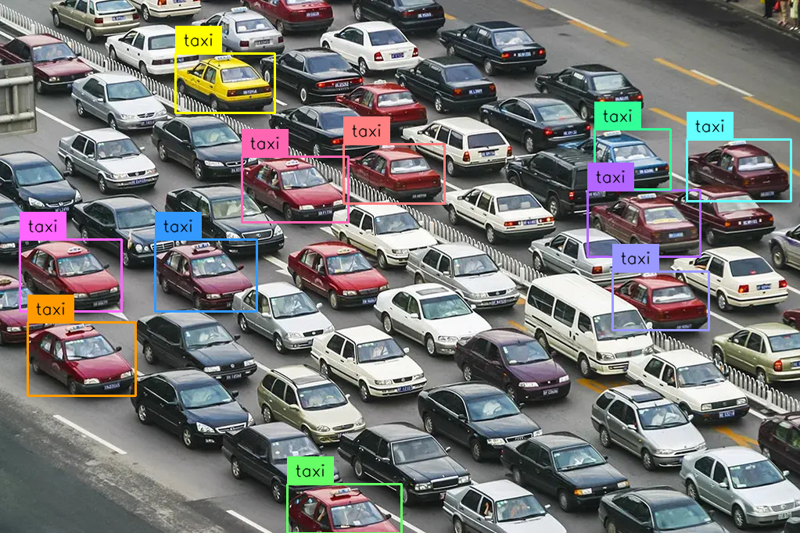

In [11]:
IMAGE = "/content/traffic_jam.jpg"

TARGET = "taxi"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "man, woman"

```json
[
	{"bbox_2d": [482, 501, 605, 886], "label": "man"},
	{"bbox_2d": [248, 503, 360, 894], "label": "woman"},
	{"bbox_2d": [0, 464, 86, 864], "label": "man"},
	{"bbox_2d": [42, 503, 152, 894], "label": "man"},
	{"bbox_2d": [136, 517, 252, 894], "label": "man"},
	{"bbox_2d": [109, 332, 207, 540], "label": "man"},
	{"bbox_2d": [208, 370, 274, 540], "label": "man"},
	{"bbox_2d": [252, 395, 337, 540], "label": "man"},
	{"bbox_2d": [339, 390, 424, 540], "label": "man"},
	{"bbox_2d": [427, 400, 490, 540], "label": "man"},
	{"bbox_2d": [431, 457, 521, 852], "label": "man"},
	{"bbox_2d": [510, 372, 592, 540], "label": "man"},
	{"bbox_2d": [588, 382, 664, 540], "label": "man"},
	{"bbox_2d": [664, 372, 750, 540], "label": "man"},
	{"bbox_2d": [750, 367, 827, 540], "label": "man"},
	{"bbox_2d": [787, 332, 874, 540], "label": "man"},
	{"bbox_2d": [857, 370, 942, 540], "label": "man"},
	{"bbox_2d": [209, 470, 283, 601], "label": "man"},
	{"bbox_2d": [335, 470, 392, 601], "label": "man"},
	{"b

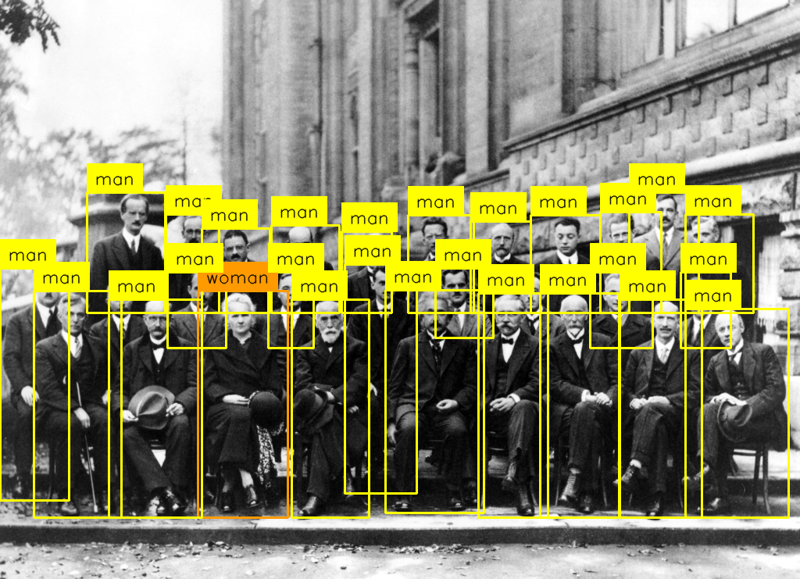

In [43]:
IMAGE = "/content/solvay_conference.jpg"

TARGET = "man, woman"
CLASSES = ["man", "woman"]

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size,
    classes=CLASSES
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "Albert and Marie"

```json
[
    {"bbox_2d": [482, 500, 605, 884], "label": "albert"},
    {"bbox_2d": [250, 503, 357, 890], "label": "marie"}
]
```


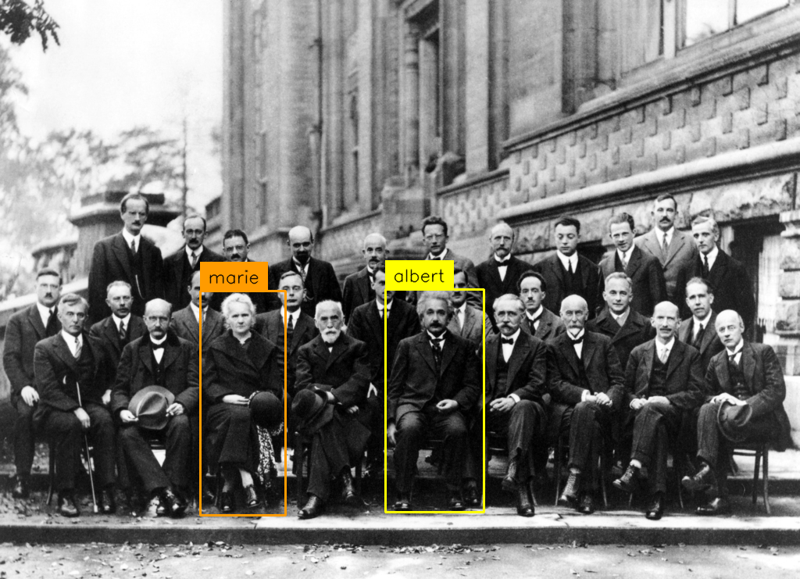

In [44]:
IMAGE = "/content/solvay_conference.jpg"

TARGET = "albert and marie"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "person between Albert and Marie"

```json
[
    {"bbox_2d": [364, 513, 462, 898], "label": "person between albert and marie"}
]
```


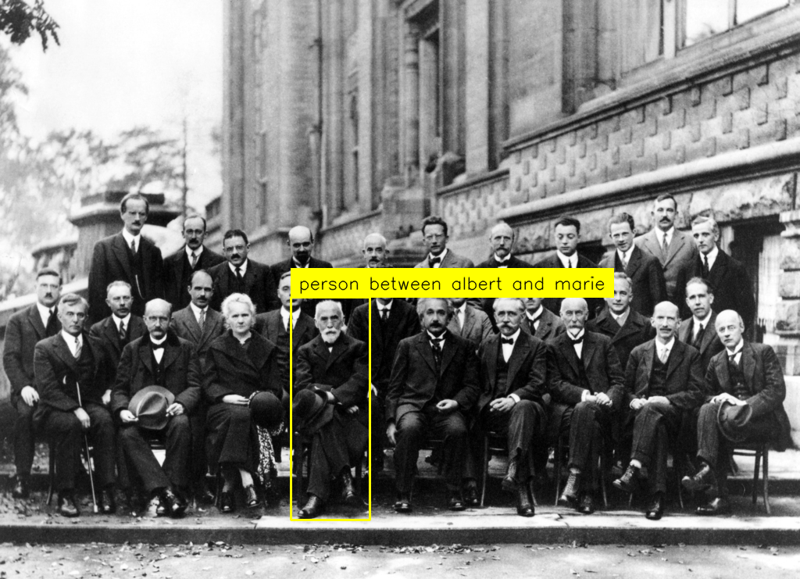

In [62]:
IMAGE = "/content/solvay_conference.jpg"

TARGET = "person between albert and marie"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "hat"

```json
[
	{"bbox_2d": [158, 663, 215, 743], "label": "hat"},
	{"bbox_2d": [309, 671, 352, 735], "label": "hat"},
	{"bbox_2d": [364, 671, 416, 743], "label": "hat"},
	{"bbox_2d": [895, 691, 944, 753], "label": "hat"}
]
```


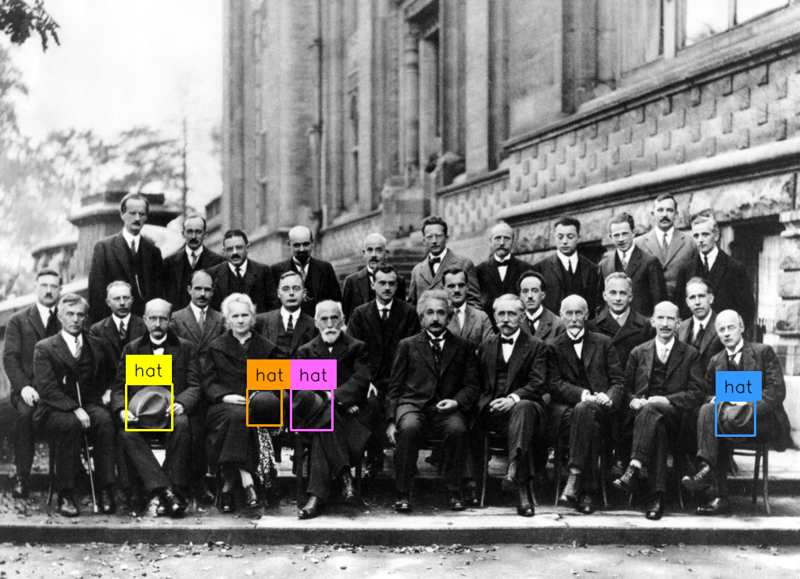

In [49]:
IMAGE = "/content/solvay_conference.jpg"

TARGET = "hat"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "cane"

```json
[
	{"bbox_2d": [110, 666, 130, 890], "label": "cane"}
]
```


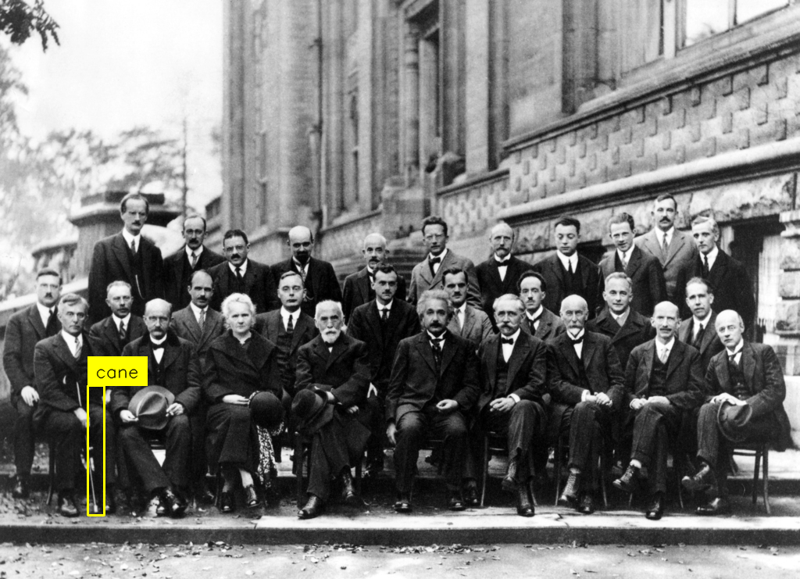

In [54]:
IMAGE = "/content/solvay_conference.jpg"

TARGET = "cane"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "people in front row"

```json
[
    {"bbox_2d": [481, 497, 604, 885], "label": "person in front row"},
    {"bbox_2d": [365, 514, 461, 896], "label": "person in front row"},
    {"bbox_2d": [248, 502, 354, 894], "label": "person in front row"},
    {"bbox_2d": [137, 516, 250, 894], "label": "person in front row"},
    {"bbox_2d": [42, 502, 148, 894], "label": "person in front row"},
    {"bbox_2d": [858, 532, 987, 894], "label": "person in front row"},
    {"bbox_2d": [767, 516, 878, 896], "label": "person in front row"},
    {"bbox_2d": [683, 506, 778, 887], "label": "person in front row"},
    {"bbox_2d": [591, 505, 687, 894], "label": "person in front row"}
]
```


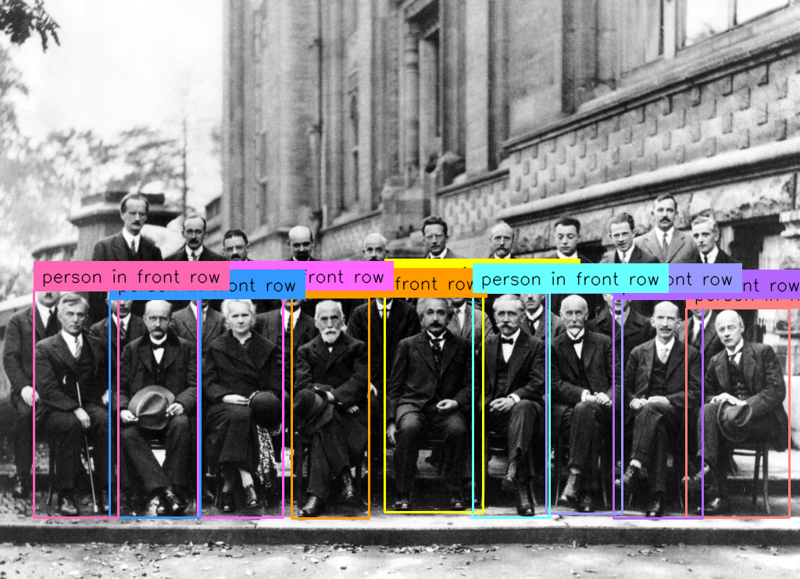

In [55]:
IMAGE = "/content/solvay_conference.jpg"

TARGET = "people in front row"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "player in red"

There are no players wearing red in the image. All players are either in white (Boston Celtics) or blue (New York Knicks). The court has green and wooden areas, and the crowd is in various colors, but no player is in red. Therefore, no coordinates can be provided for a player in red.

```json
[]
```


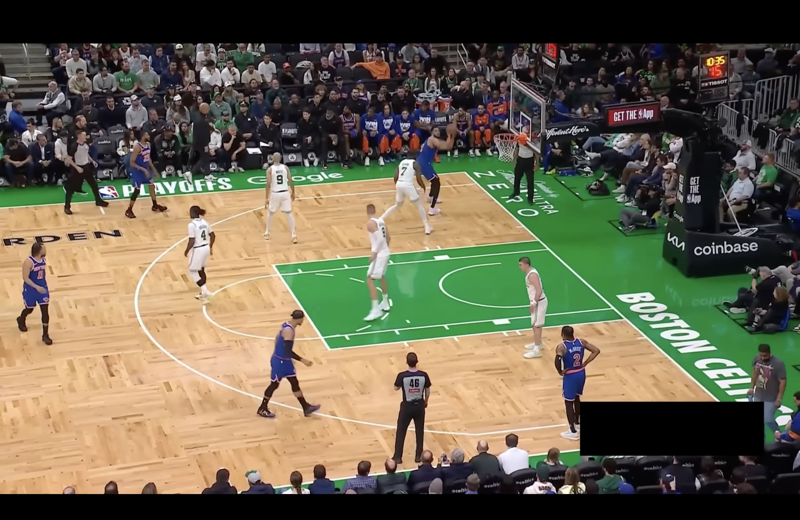

In [57]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "player in red"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "player in white"

```json
[
	{"bbox_2d": [452, 389, 501, 618], "label": "player in white"},
	{"bbox_2d": [328, 293, 373, 468], "label": "player in white"},
	{"bbox_2d": [475, 288, 542, 453], "label": "player in white"},
	{"bbox_2d": [229, 393, 270, 583], "label": "player in white"},
	{"bbox_2d": [646, 494, 686, 688], "label": "player in white"}
]
```


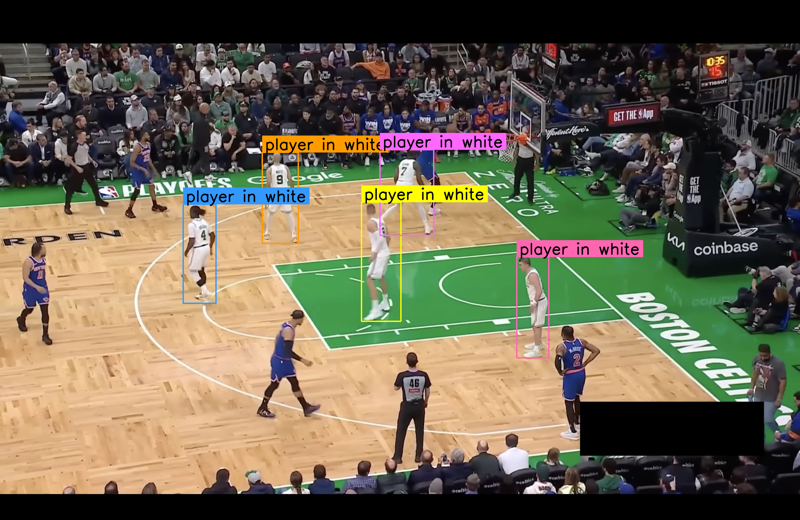

In [58]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "player in white"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "player #7"

```json
[
    {"bbox_2d": [472, 288, 542, 452], "label": "player #7"}
]
```


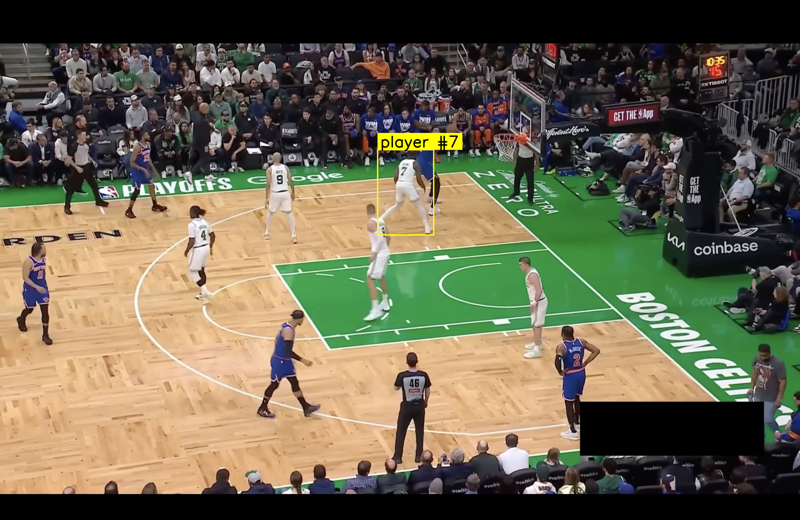

In [59]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "player #7"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "player new york knicks"

```json
[
	{"bbox_2d": [319, 593, 402, 805], "label": "player new york knicks"},
	{"bbox_2d": [20, 465, 66, 663], "label": "player new york knicks"},
	{"bbox_2d": [155, 247, 210, 420], "label": "player new york knicks"},
	{"bbox_2d": [519, 236, 569, 413], "label": "player new york knicks"},
	{"bbox_2d": [694, 626, 750, 846], "label": "player new york knicks"}
]
```


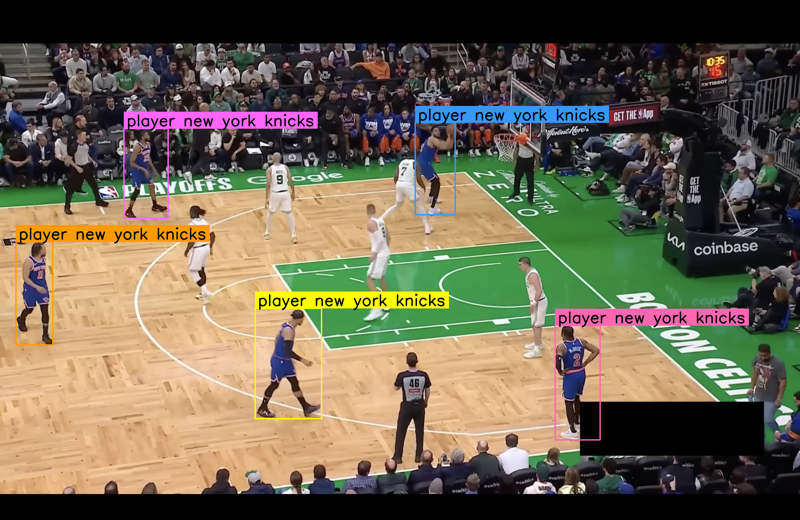

In [61]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "player new york knicks"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "player about to shoot"

```json
[
    {"bbox_2d": [516, 234, 570, 414], "label": "player about to shoot"}
]
```


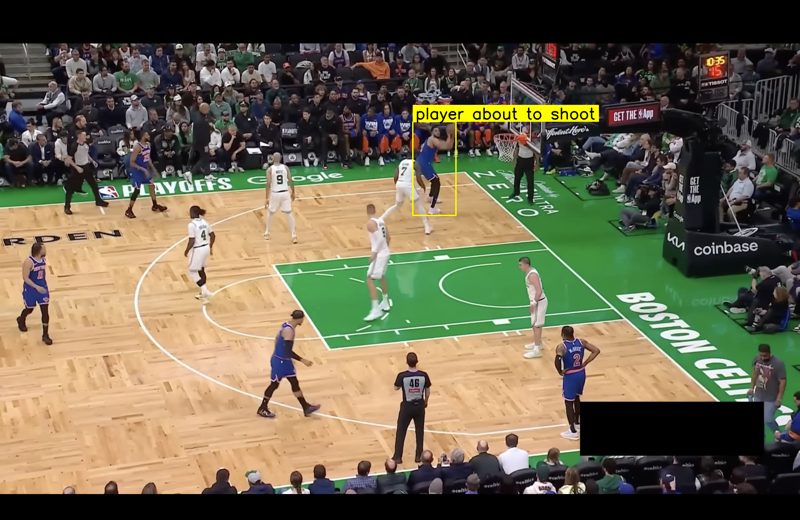

In [68]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "player about to shoot"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "player new yourk knicks on bench"

```json
[
    {"bbox_2d": [446, 203, 486, 317], "label": "player new yourk knicks on bench"},
    {"bbox_2d": [486, 203, 522, 317], "label": "player new yourk knicks on bench"},
    {"bbox_2d": [522, 189, 556, 307], "label": "player new yourk knicks on bench"},
    {"bbox_2d": [564, 203, 593, 307], "label": "player new yourk knicks on bench"},
    {"bbox_2d": [588, 197, 616, 303], "label": "player new yourk knicks on bench"},
    {"bbox_2d": [616, 175, 639, 294], "label": "player new yourk knicks on bench"}
]
```


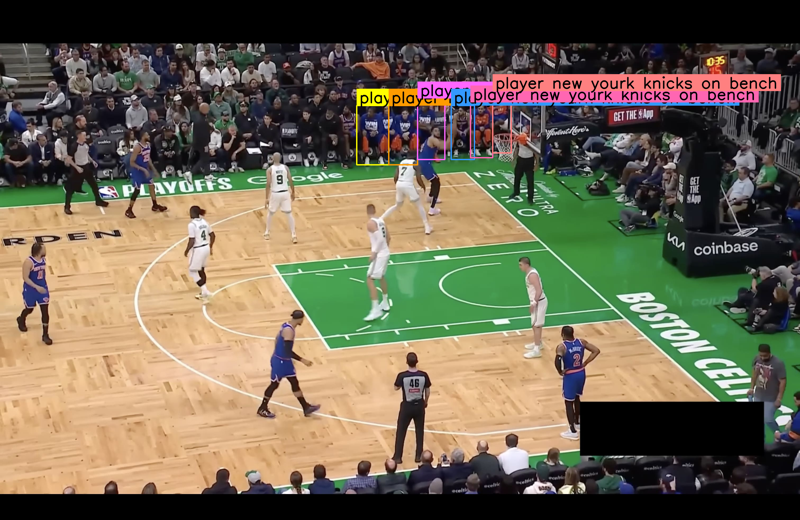

In [70]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "player new yourk knicks on bench"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

### Detect "sponsor logo"

```json
[
	{"bbox_2d": [859, 458, 950, 496], "label": "sponsor logo"},
	{"bbox_2d": [832, 443, 858, 481], "label": "sponsor logo"},
	{"bbox_2d": [309, 326, 431, 355], "label": "sponsor logo"},
	{"bbox_2d": [126, 347, 292, 384], "label": "sponsor logo"},
	{"bbox_2d": [589, 325, 698, 418], "label": "sponsor logo"},
	{"bbox_2d": [764, 204, 827, 238], "label": "sponsor logo"},
	{"bbox_2d": [854, 334, 878, 392], "label": "sponsor logo"}
]
```


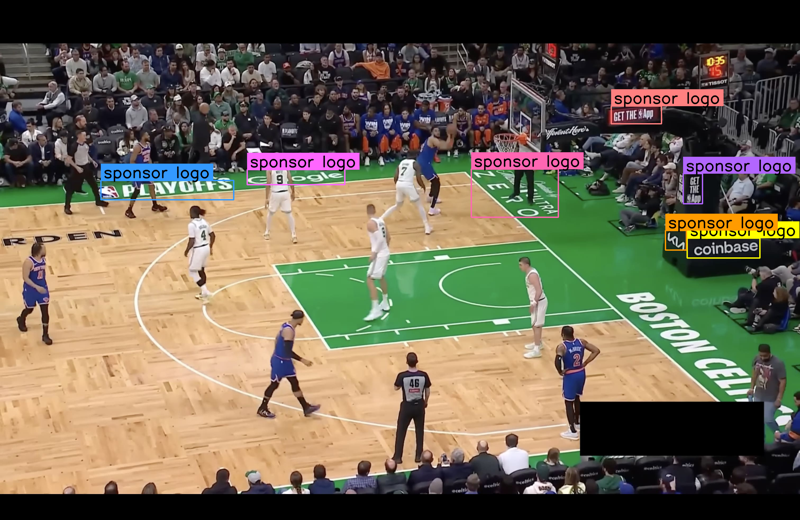

In [73]:
IMAGE = "/content/basketball_game.jpg"

TARGET = "sponsor logo"

image = Image.open(IMAGE).convert("RGB")
response = qwen_detect(image, TARGET)

print(response)

detections = sv.Detections.from_vlm(
    vlm=sv.VLM.QWEN_3_VL,
    result=response,
    resolution_wh=image.size
)

annotated_image = image.copy()
annotated_image = annotate_image(image=annotated_image, detections=detections, smart_position=False)
annotated_image.thumbnail((800, 800))
annotated_image

<div align="center">
  <p>
    Looking for more tutorials or have questions?
    Check out our <a href="https://github.com/roboflow/notebooks">GitHub repo</a> for more notebooks,
    or visit our <a href="https://discord.gg/GbfgXGJ8Bk">discord</a>.
  </p>
  
  <p>
    <strong>If you found this helpful, please consider giving us a ⭐
    <a href="https://github.com/roboflow/notebooks">on GitHub</a>!</strong>
  </p>

</div>